# Face Recognitions Classifications Model Exploration

## Overview

In this exploration, we aim to investigate the effectiveness of various deep learning models for image classification tasks. Specifically, we will focus on three popular architectures: VGG16, Inception v3, and Inception v1 (GoogLeNet).

### VGG16
VGG16 is a convolutional neural network (CNN) architecture proposed by the Visual Geometry Group at the University of Oxford. It consists of 16 weight layers and is known for its simplicity and effectiveness in image recognition tasks. The network architecture comprises a series of convolutional layers followed by max-pooling layers and fully connected layers.

### Inception v3
Inception v3 is an evolution of the original GoogLeNet architecture, developed by researchers at Google. It introduces several improvements over Inception v1, including factorized convolutions, batch normalization, and label smoothing. Inception v3 aims to achieve better accuracy and computational efficiency compared to its predecessor.

### InceptionResNetV2
InceptionResNetV2 is a deep convolutional neural network architecture that combines the principles of the Inception architecture and residual connections. It was proposed by Google researchers as an extension to the Inception family of networks.


## Methodology
1. **Dataset Selection**: Choose benchmark datasets such as CIFAR-10, CIFAR-100, or ImageNet for evaluation.
2. **Model Implementation**: Implement VGG16, Inception v3, and Inception v1 architectures using deep learning frameworks in Tensorflow.
3. **Training and Evaluation**: Train the models on the selected datasets and evaluate their performance in terms of accuracy, computational efficiency, and memory usage.
5. **Analysis and Comparison**: Analyze the results to compare the performance of different architectures and draw insights into their strengths and weaknesses.

## Expected Outcomes
- Identification of the most suitable architecture for image classification tasks based on performance metrics.
- Insights into the trade-offs between accuracy, computational efficiency, and model complexity.

---


# Import Pre-requisites Packages

In [1]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from tensorflow.keras.applications import InceptionV3, InceptionResNetV2, VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential, load_model
import numpy as np
from sklearn.metrics import roc_curve, confusion_matrix
import time

2024-03-16 15:04:36.238049: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-03-16 15:04:36.503385: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-16 15:04:36.503440: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-16 15:04:36.550269: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-16 15:04:36.646336: I tensorflow/core/platform/cpu_feature_guar

# Hardware Specifications

In [2]:
import cpuinfo
import psutil
import GPUtil

def print_hardware_info():
    cpu_info = cpuinfo.get_cpu_info()
    print("CPU Information:")
    print("Architecture:", cpu_info['arch'])
    print("Cores:", psutil.cpu_count(logical=False))
    print("Threads:", psutil.cpu_count(logical=True))
    print()

    mem_info = psutil.virtual_memory()
    print("Memory Information:")
    print("Total Memory:", f"{mem_info.total / (1024 ** 3):.2f} GB")
    print("Available Memory:", f"{mem_info.available / (1024 ** 3):.2f} GB")
    print()

    gpus = GPUtil.getGPUs()
    if gpus:
        print("GPU Information:")
        for i, gpu in enumerate(gpus):
            print(f"GPU {i+1}:")
            print("Name:", gpu.name)
            print("Memory Total:", f"{gpu.memoryTotal:.2f} MB")
            print("Memory Used:", f"{gpu.memoryUsed:.2f} MB")
            print("Memory Free:", f"{gpu.memoryFree:.2f} MB")
            print("Utilization:", f"{gpu.load * 100:.2f}%")
            print()
    else:
        print("No GPU detected.")

print_hardware_info()

CPU Information:
Architecture: X86_64
Cores: 6
Threads: 12

Memory Information:
Total Memory: 29.38 GB
Available Memory: 26.58 GB

GPU Information:
GPU 1:
Name: NVIDIA GeForce RTX 3050
Memory Total: 8192.00 MB
Memory Used: 916.00 MB
Memory Free: 7140.00 MB
Utilization: 10.00%



# Exploratory Data Analysis

Next we cleansing the data based on the pre-requisites of binary data generator.

I decide to reads data from a CSV file named 'list_attribute.txt', filters the data based on filenames present in the 'images/' directory, and displays the filtered data.

In this experimentations I'm using datasets provided by AI Indonesia, which is a subset data from CelebA datasets.

In [3]:
df = pd.read_csv('list_attribute.txt', sep='\s+', index_col=0)
image_files = os.listdir('images/')
filtered_df = df[df.index.isin(image_files)]
filtered_df.head()

,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
000051.jpg,1,-1,-1,1,1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
000052.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,-1,...,-1,-1,1,-1,-1,-1,-1,-1,-1,-1
000065.jpg,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,...,-1,1,1,-1,-1,-1,-1,-1,-1,1
000166.jpg,1,-1,-1,-1,-1,-1,-1,1,-1,-1,...,1,-1,-1,-1,-1,1,-1,-1,-1,-1
000198.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1


In [4]:
# Normalized filtered dataframe for easier training

filtered_df.reset_index(inplace=True)
filtered_df = filtered_df.rename(columns={'index': 'Filename'})

clean_df = filtered_df[['Filename', 'Male']]
clean_df.loc[:, ('Male')] = clean_df['Male'].astype('str')

clean_df.head()

/tmp/ipykernel_2428/2189718664.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['1' '1' '1' ... '-1' '-1' '1']' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  clean_df.loc[:, ('Male')] = clean_df['Male'].astype('str')


,Filename,Male
0,000051.jpg,1
1,000052.jpg,1
2,000065.jpg,1
3,000166.jpg,1
4,000198.jpg,-1


In [5]:
# Split train and test data with 20% size.
# Then spliting train and validation from train data by 20% size also.

train_df, test_df = train_test_split(clean_df, test_size=0.2)

train_df, validation_df = train_test_split(train_df, test_size=0.2)

{'train': train_df.shape, 'test': test_df.shape, 'validation': validation_df.shape}

{'train': (3200, 2), 'test': (1000, 2), 'validation': (800, 2)}

# Model Iterations #1

Parameters:

1. Batch size: 64
2. Seed: 1024
3. Target Size: (128, 128)
4. Validation datasets size: 20%
5. Data test size: 20%
7. Additional fully connected layer:
   1. Global Conv 2d
   2. Relu
   3. Sigmoid
8. Epoch: 20
9.  Optimizers: adam
10. Pre-trained data: imagenet
11. Loss function: binary cross entropy
12. Layer freeze: true
13. Model input shape: (128, 128, 3)

### Training and Validation Image Generator

In [6]:
BATCH_SIZE = 64
SEED = 1024
TARGET_SIZE = (128, 128)

data_generator = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True, validation_split=0.2)

train_generator = data_generator.flow_from_dataframe(
 dataframe=train_df,
 directory='images/',
 x_col='Filename',
 y_col='Male',
 subset='training',
 batch_size=BATCH_SIZE,
 seed=SEED,
 shuffle=True,
 class_mode='binary',
 target_size=TARGET_SIZE
)

validation_generator = data_generator.flow_from_dataframe(
 dataframe=validation_df,
 directory='images/',
 x_col='Filename',
 y_col='Male',
 subset='validation',
 batch_size=BATCH_SIZE,
 seed=SEED,
 shuffle=True,
 class_mode='binary',
 target_size=TARGET_SIZE
)

Found 2560 validated image filenames belonging to 2 classes.
Found 160 validated image filenames belonging to 2 classes.


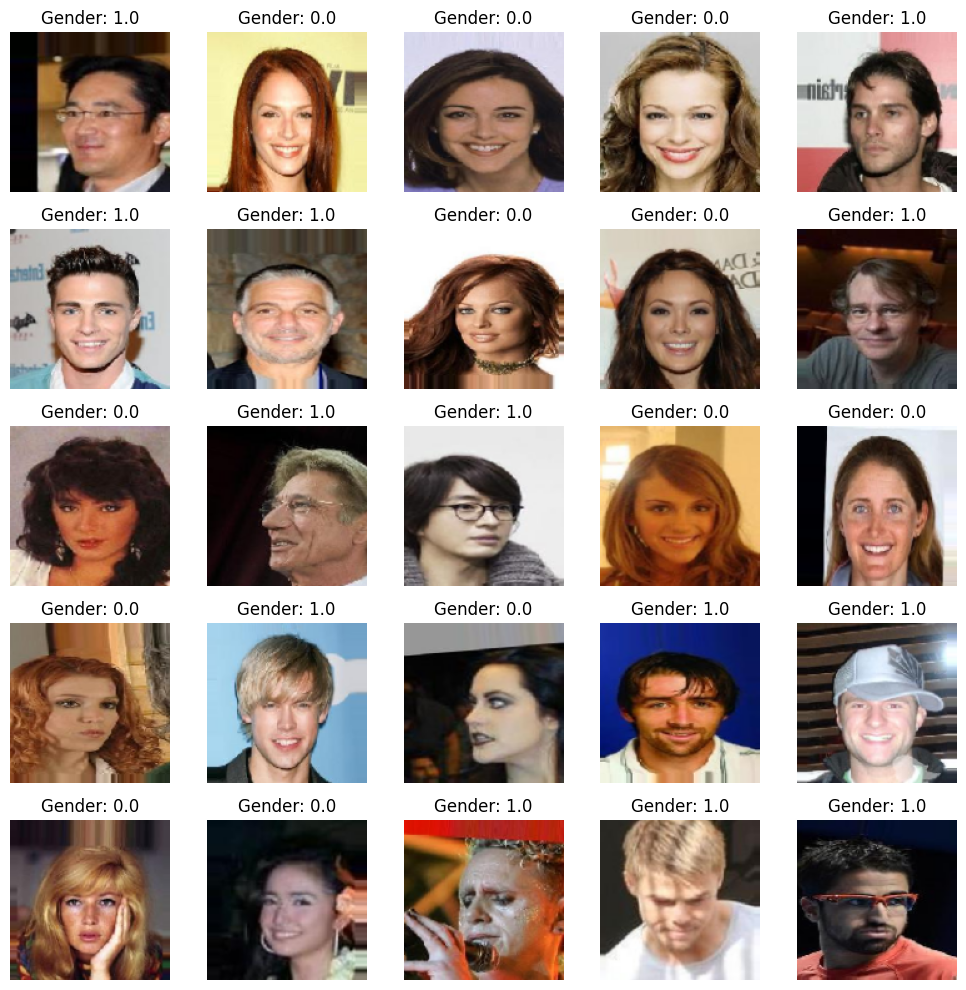

In [7]:
batch = train_generator.next()
fig, axs = plt.subplots(5, 5, figsize=(10, 10))
for i in range(5):
    for j in range(5):
        index = i*5+j
        axs[i, j].imshow(batch[0][index])
        axs[i, j].axis('off')
        axs[i, j].set_title(f'Gender: {batch[1][index]}')

plt.tight_layout()
plt.show()

### Model Training

In [8]:
WEIGHTS = 'imagenet'
MODEL_INPUT_SHAPE = (128, 128, 3)


def input_model(base_model):
  name = base_model.name
  print(f"Freezing layers for model: {name}")
  for layer in base_model.layers:
    layer.trainable = False

  print(f"Adding fully connected layers for model: {name}")
  model = Sequential()
  model.add(base_model)
  model.add(GlobalAveragePooling2D())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(1, activation='sigmoid'))
  return model

models = {}

models['inceptionV3'] = input_model(InceptionV3(weights=WEIGHTS, include_top=False, input_shape=MODEL_INPUT_SHAPE, classifier_activation=None))
models['inceptionResNetV2'] = input_model(InceptionResNetV2(weights=WEIGHTS, include_top=False, input_shape=MODEL_INPUT_SHAPE, classifier_activation=None))
models['vgg16'] = input_model(VGG16(weights=WEIGHTS, include_top=False, input_shape=MODEL_INPUT_SHAPE, classifier_activation=None))

models

2024-03-16 15:04:42.438579: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-03-16 15:04:42.580420: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-03-16 15:04:42.580701: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-03-16 15:04:42.582147: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-03-16 15:04:42.582374: I external/local_xla/xla/stream_executor

Freezing layers for model: inception_v3
Adding fully connected layers for model: inception_v3
Freezing layers for model: inception_resnet_v2
Adding fully connected layers for model: inception_resnet_v2
Freezing layers for model: vgg16
Adding fully connected layers for model: vgg16


{'inceptionV3': <keras.src.engine.sequential.Sequential at 0x7f40840882d0>,
 'inceptionResNetV2': <keras.src.engine.sequential.Sequential at 0x7f40403a1e50>,
 'vgg16': <keras.src.engine.sequential.Sequential at 0x7f40401cb710>}

In [9]:
histories = {}

for name, model in models.items():
  print(f"Start training for model: {name}")
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  history = model.fit(train_generator, epochs=20, validation_data=validation_generator)
  histories.update({name: history})

Start training for model: inceptionV3
Epoch 1/20


2024-03-16 15:04:55.260896: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
2024-03-16 15:04:59.816571: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f3f3f1d9a90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-03-16 15:04:59.816606: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3050, Compute Capability 8.6
2024-03-16 15:04:59.827815: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1710576299.908509    3952 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


40/40 [==============================] - 18s 256ms/step - loss: 0.5463 - accuracy: 0.7766 - val_loss: 0.4776 - val_accuracy: 0.7812
Epoch 2/20
40/40 [==============================] - 6s 138ms/step - loss: 0.3538 - accuracy: 0.8488 - val_loss: 0.3914 - val_accuracy: 0.8500
Epoch 3/20
40/40 [==============================] - 6s 142ms/step - loss: 0.3210 - accuracy: 0.8676 - val_loss: 0.3555 - val_accuracy: 0.8313
Epoch 4/20
40/40 [==============================] - 6s 139ms/step - loss: 0.3107 - accuracy: 0.8785 - val_loss: 0.3618 - val_accuracy: 0.8562
Epoch 5/20
40/40 [==============================] - 6s 145ms/step - loss: 0.2943 - accuracy: 0.8813 - val_loss: 0.3472 - val_accuracy: 0.8687
Epoch 6/20
40/40 [==============================] - 6s 139ms/step - loss: 0.2821 - accuracy: 0.8836 - val_loss: 0.3254 - val_accuracy: 0.8625
Epoch 7/20
40/40 [==============================] - 6s 138ms/step - loss: 0.2782 - accuracy: 0.8926 - val_loss: 0.3607 - val_accuracy: 0.8438
Epoch 8/20
40/40

### Model Validations

3/3 [==============================] - 0s 104ms/step


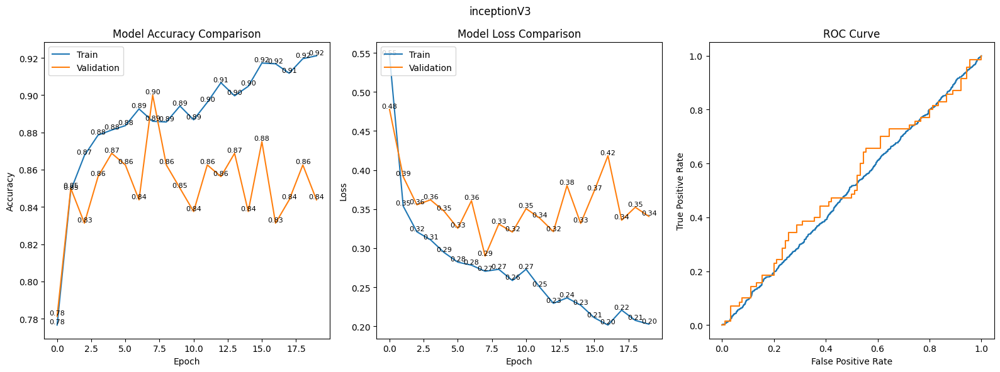

3/3 [==============================] - 0s 101ms/step


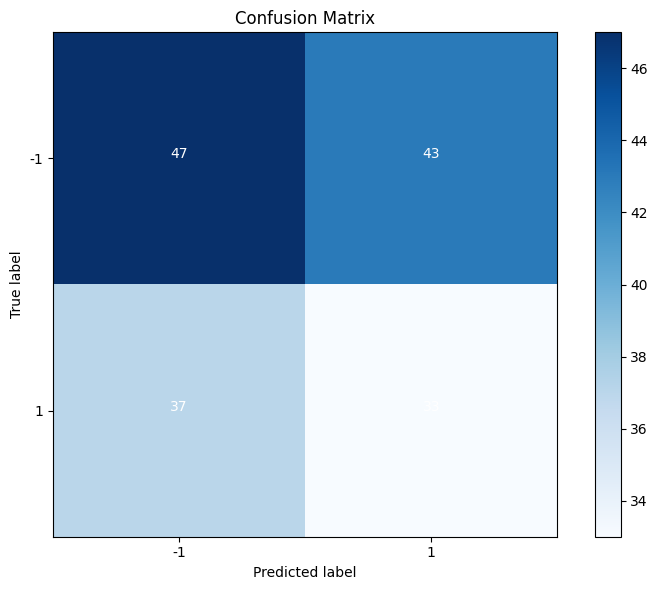

3/3 [==============================] - 0s 100ms/step


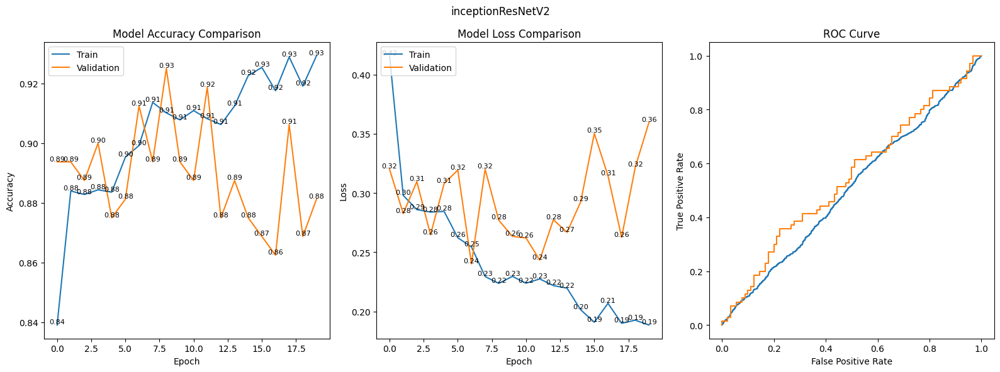

3/3 [==============================] - 0s 109ms/step


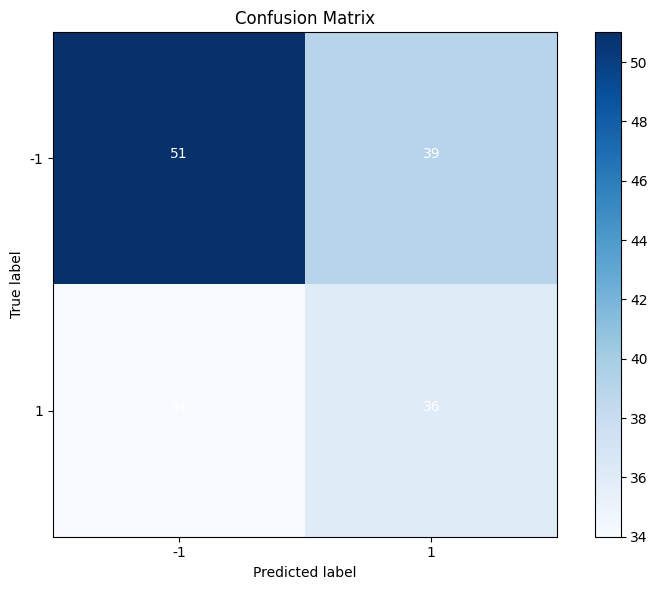

3/3 [==============================] - 0s 107ms/step


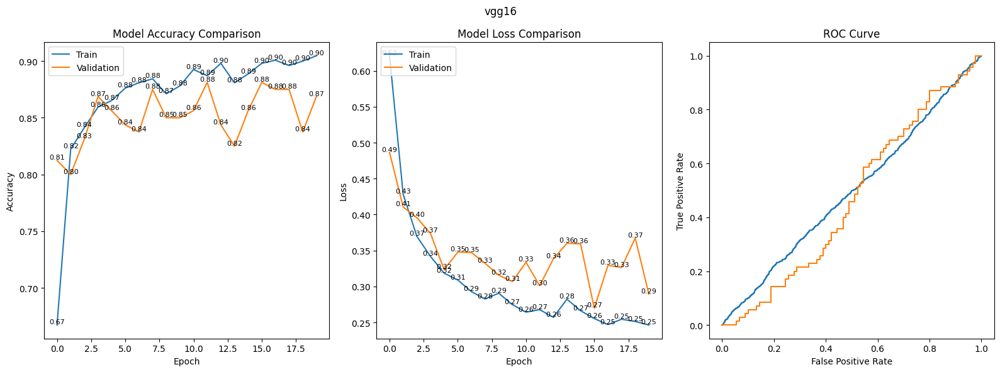

3/3 [==============================] - 0s 104ms/step


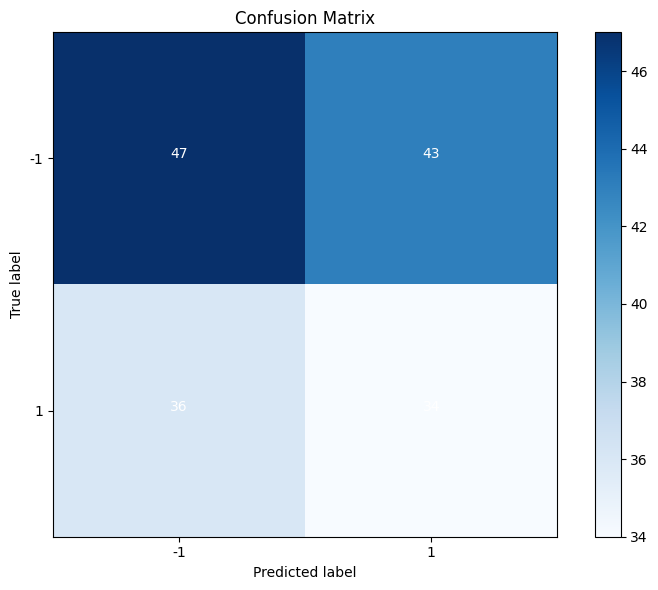

In [10]:
def plot_histories(histories):
    for name, history in histories.items():
        plt.figure(figsize=(16, 6))

        # Plot training & validation accuracy values
        plt.subplot(1, 3, 1)
        plt.plot(history.history['accuracy'], label='Train')
        plt.plot(history.history['val_accuracy'], label='Validation')
        plt.title('Model Accuracy Comparison')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend(loc='upper left')

        for i in range(len(history.history['accuracy'])):
            plt.text(i, history.history['accuracy'][i], f'{history.history["accuracy"][i]:.2f}', ha='center', va='bottom', fontsize=8)
        for i in range(len(history.history['val_accuracy'])):
            plt.text(i, history.history['val_accuracy'][i], f'{history.history["val_accuracy"][i]:.2f}', ha='center', va='bottom', fontsize=8)

        # Plot training & validation loss values
        plt.subplot(1, 3, 2)
        plt.plot(history.history['loss'], label='Train')
        plt.plot(history.history['val_loss'], label='Validation')
        plt.title('Model Loss Comparison')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend(loc='upper left')

        for i in range(len(history.history['loss'])):
            plt.text(i, history.history['loss'][i], f'{history.history["loss"][i]:.2f}', ha='center', va='bottom', fontsize=8)
        for i in range(len(history.history['val_loss'])):
            plt.text(i, history.history['val_loss'][i], f'{history.history["val_loss"][i]:.2f}', ha='center', va='bottom', fontsize=8)

        # ROC curve
        plt.subplot(1, 3, 3)
        y_pred_train = model.predict(train_generator, steps=None)
        fpr_train, tpr_train, thresholds_train = roc_curve(train_generator.classes, y_pred_train)
        plt.plot(fpr_train, tpr_train, label='Train ROC curve')

        y_pred_valid = model.predict(validation_generator, steps=None)
        fpr_valid, tpr_valid, thresholds_valid = roc_curve(validation_generator.classes, y_pred_valid)
        plt.plot(fpr_valid, tpr_valid, label='Validation ROC curve')

        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')

        plt.suptitle(name)
        plt.tight_layout()
        plt.show()

        # Confusion Matrix
        plt.figure(figsize=(8, 6))
        y_pred = model.predict(validation_generator).round()
        cm = confusion_matrix(validation_generator.classes, y_pred)
        plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.colorbar()
        tick_marks = np.arange(len(train_generator.class_indices))
        plt.xticks(tick_marks, train_generator.class_indices.keys())
        plt.yticks(tick_marks, train_generator.class_indices.keys())
        thresh = cm.max() / 2.
        for i, j in np.ndindex(cm.shape):
            plt.text(j, i, format(cm[i, j], 'd'), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
        plt.ylabel('True label')
        plt.xlabel('Predicted label')
        plt.tight_layout()
        plt.show()

plot_histories(histories)

2/2 [==============================] - 1s 18ms/step


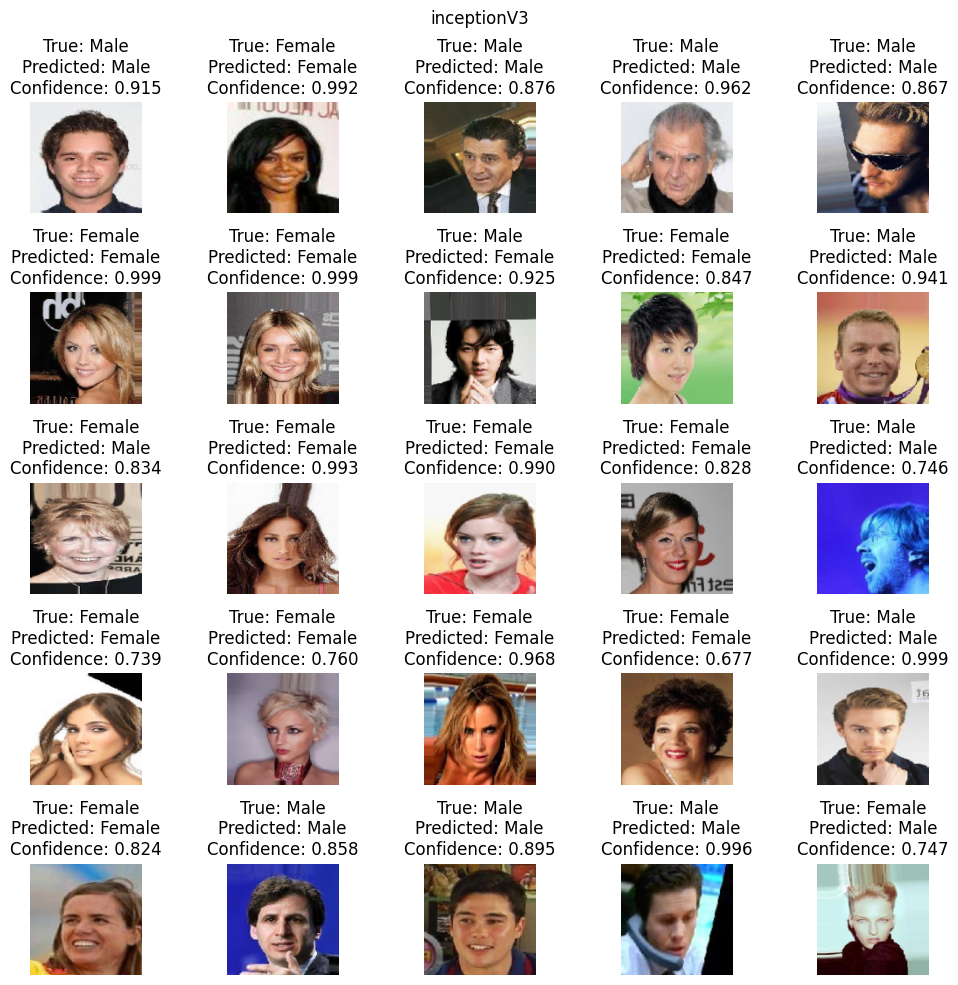

2/2 [==============================] - 2s 180ms/step


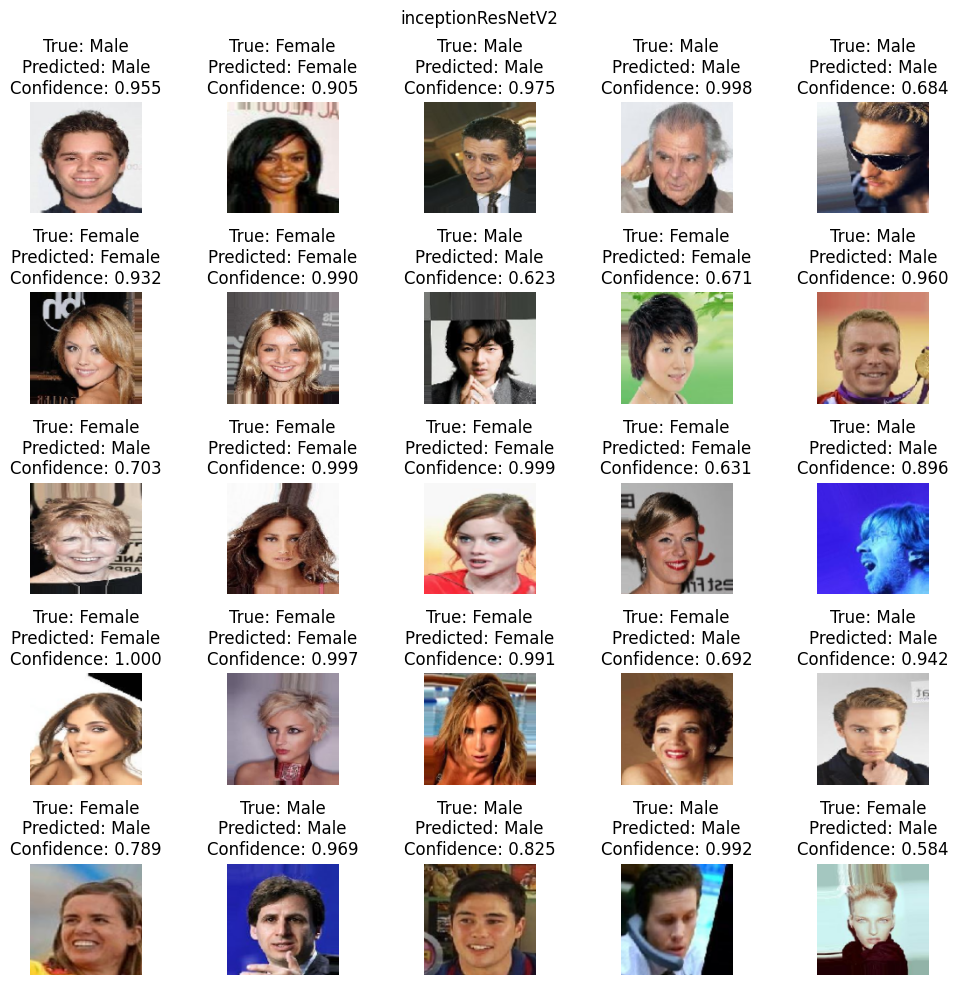

2/2 [==============================] - 0s 44ms/step


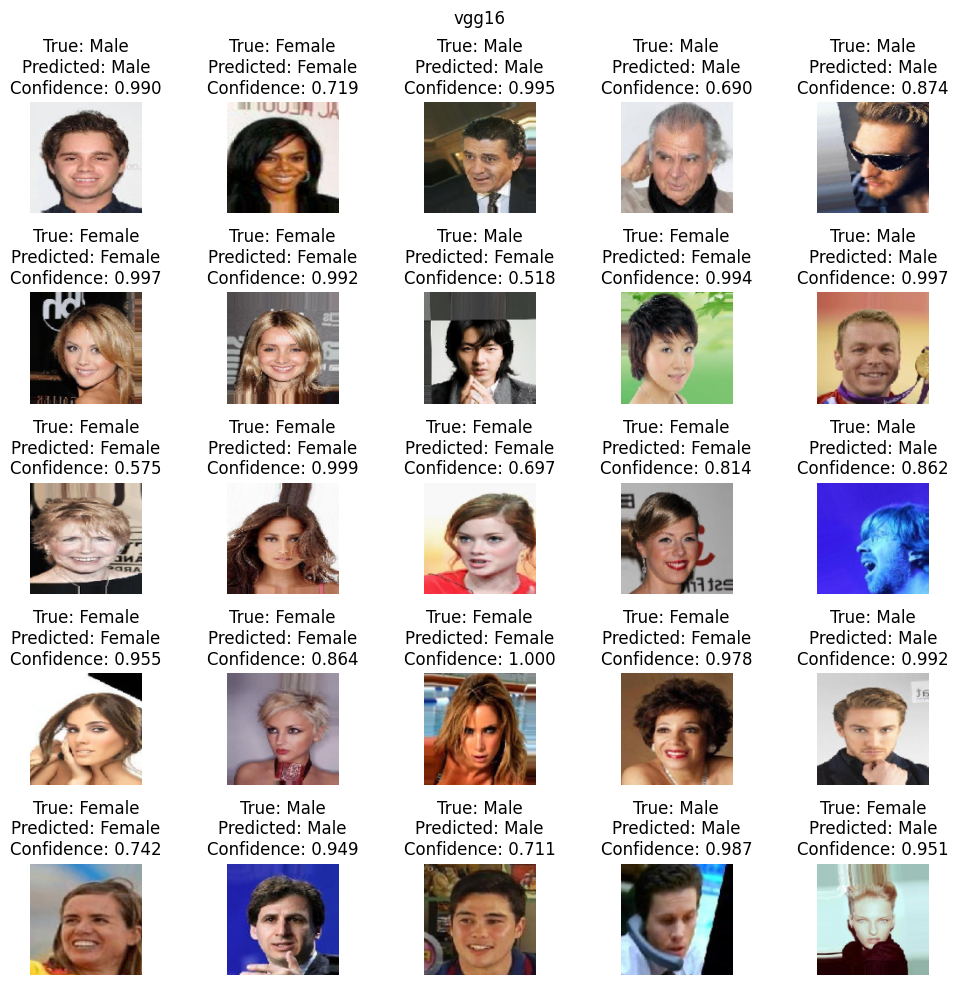

In [11]:
validation_generator.reset()

batch = validation_generator.next()

def plot_prediction(models, batch):
    for name, model in models.items():
        fig, axs = plt.subplots(5, 5, figsize=(10, 10))

        predictions = model.predict(batch[0])

        for i in range(5):
            for j in range(5):
                index = i * 5 + j
                axs[i, j].imshow(batch[0][index])
                axs[i, j].axis('off')
                true_label = 'Male' if batch[1][index] == 1 else 'Female'
                predicted_label = 'Male' if predictions[index] >= 0.5 else 'Female'
                confidence = predictions[index] if predicted_label == 'Male' else 1 - predictions[index]
                axs[i, j].set_title(f'True: {true_label}\nPredicted: {predicted_label}\nConfidence: {confidence[0]:.3f}')

        plt.suptitle(name)
        plt.tight_layout()
        plt.show()

plot_prediction(models, batch)

## Save Model

In [12]:
for name, model in models.items():
  model.save(f"./output/{name}-iteration-1.keras")

# Model Iterations #2

Parameters:

1. Batch size: 64
2. Seed: 1024
3. Target Size: (128, 128)
4. Validation datasets size: 20%
5. Data test size: 20%
7. Additional fully connected layer:
   1. Global Conv 2d
   2. Relu
   3. Sigmoid
8. Epoch: 50
9.  Optimizers: adam
10. Pre-trained data: imagenet
11. Loss function: binary cross entropy
12. Layer freeze: true
13. Model input shape: (128, 128, 3)

### Model Training

In [13]:
train_generator.reset()
validation_generator.reset()

histories = {}

for name, model in models.items():
  print(f"Start training for model: {name}")
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  history = model.fit(train_generator, epochs=30, validation_data=validation_generator)
  histories.update({name: history})

Start training for model: inceptionV3
Epoch 1/30
40/40 [==============================] - 9s 155ms/step - loss: 0.2182 - accuracy: 0.9141 - val_loss: 0.3905 - val_accuracy: 0.8375
Epoch 2/30
40/40 [==============================] - 6s 137ms/step - loss: 0.1947 - accuracy: 0.9223 - val_loss: 0.3596 - val_accuracy: 0.8687
Epoch 3/30
40/40 [==============================] - 5s 136ms/step - loss: 0.1968 - accuracy: 0.9164 - val_loss: 0.3668 - val_accuracy: 0.8562
Epoch 4/30
40/40 [==============================] - 6s 139ms/step - loss: 0.2041 - accuracy: 0.9141 - val_loss: 0.3402 - val_accuracy: 0.8625
Epoch 5/30
40/40 [==============================] - 6s 149ms/step - loss: 0.1746 - accuracy: 0.9352 - val_loss: 0.3688 - val_accuracy: 0.8438
Epoch 6/30
40/40 [==============================] - 6s 149ms/step - loss: 0.1893 - accuracy: 0.9246 - val_loss: 0.3941 - val_accuracy: 0.8313
Epoch 7/30
40/40 [==============================] - 5s 134ms/step - loss: 0.1737 - accuracy: 0.9316 - val_loss

## Model Validations

3/3 [==============================] - 0s 101ms/step


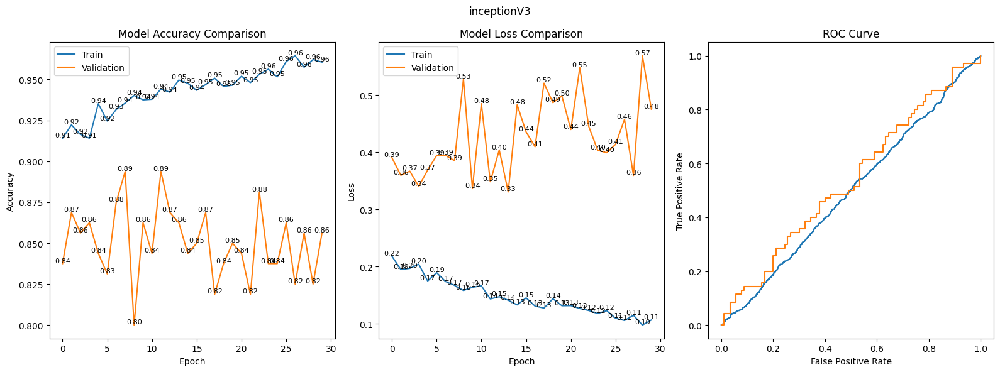

3/3 [==============================] - 0s 110ms/step


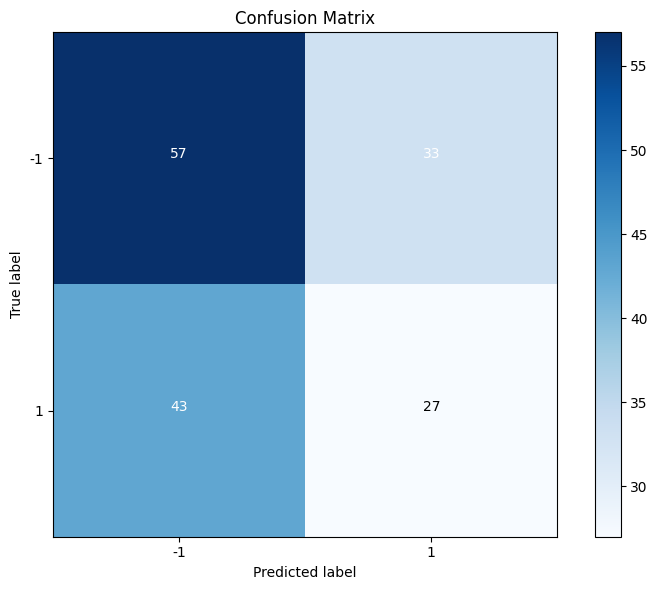

3/3 [==============================] - 0s 104ms/step


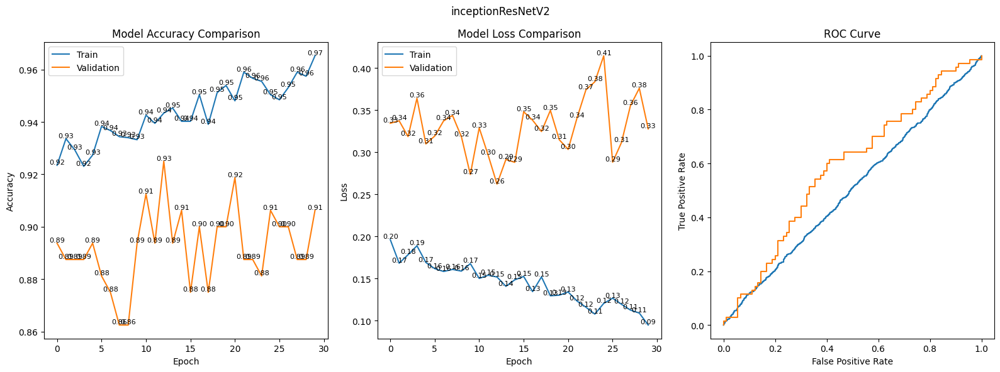

3/3 [==============================] - 0s 105ms/step


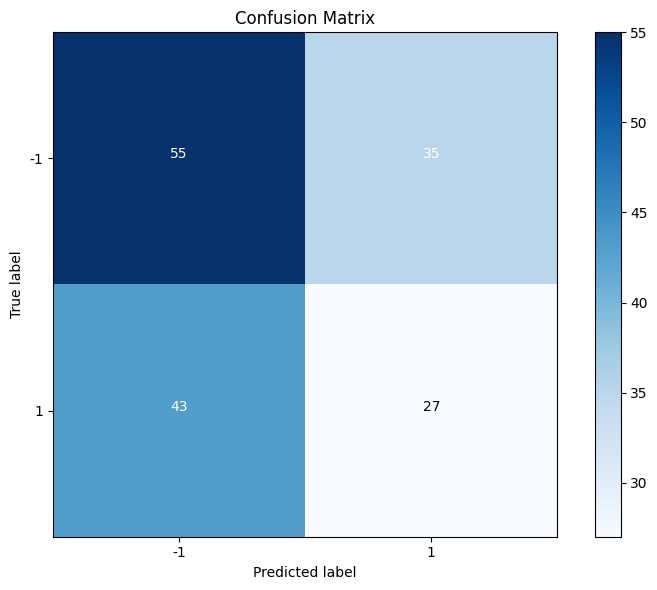

3/3 [==============================] - 0s 104ms/step


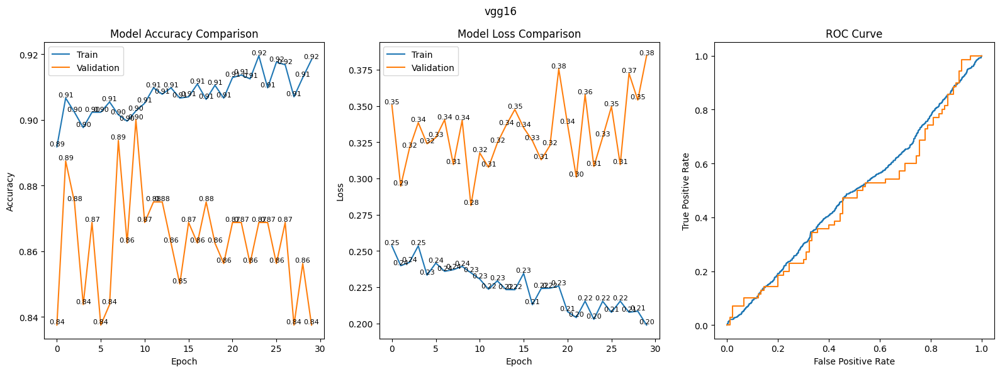

3/3 [==============================] - 0s 105ms/step


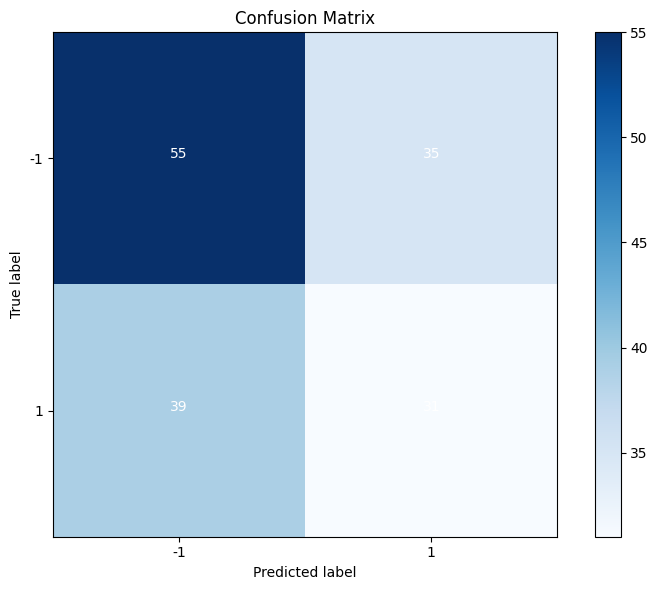

In [14]:
plot_histories(histories)

2/2 [==============================] - 1s 33ms/step


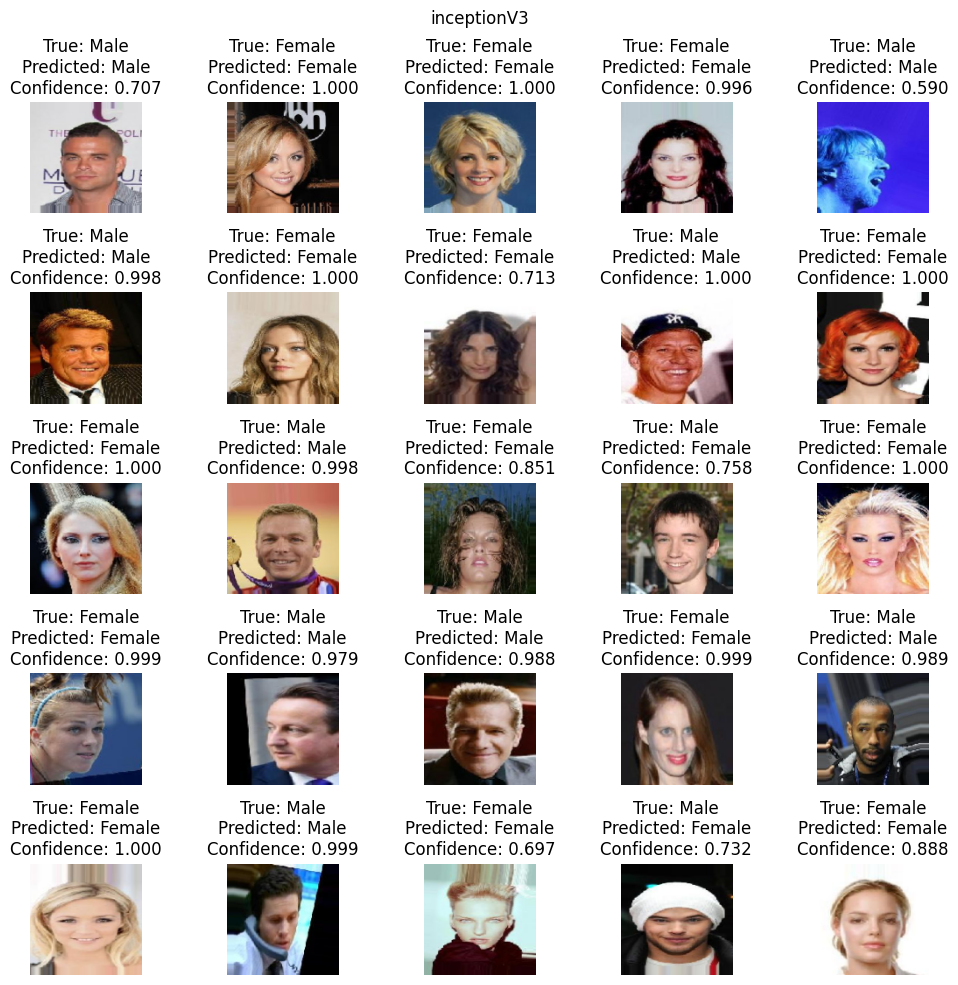

2/2 [==============================] - 3s 204ms/step


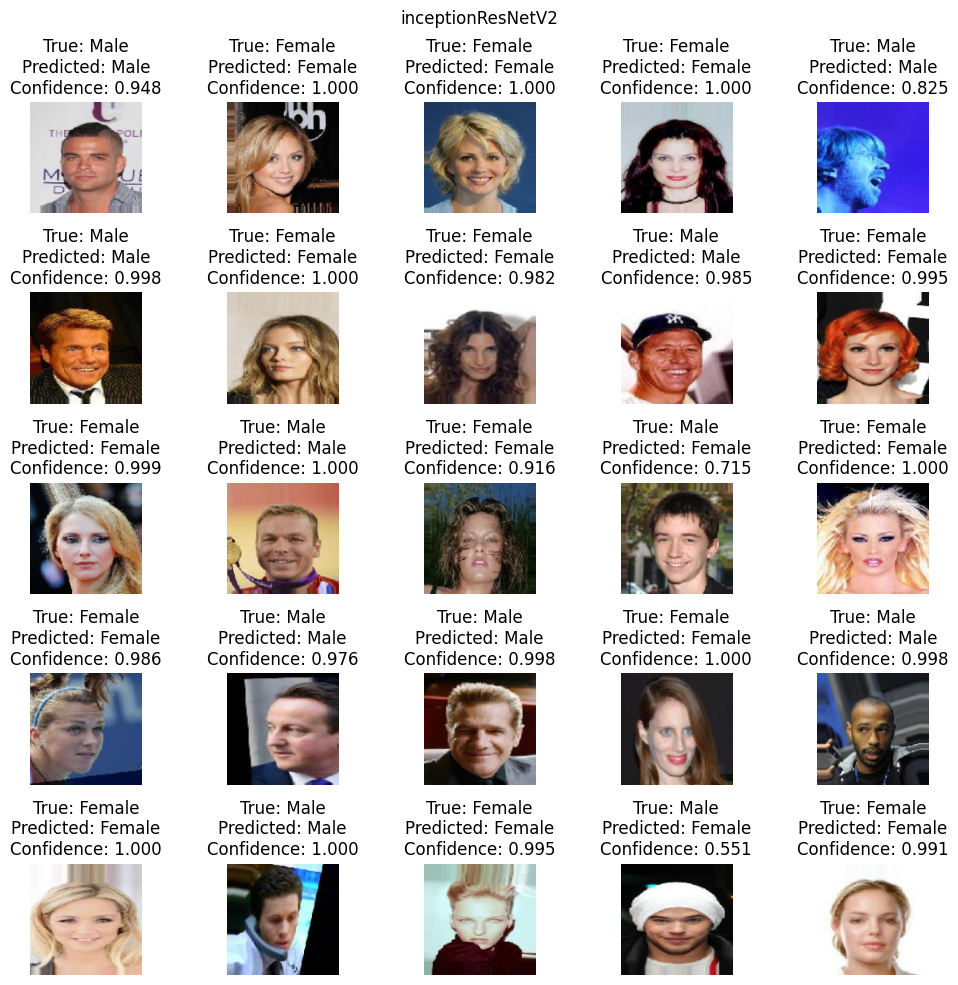

2/2 [==============================] - 0s 45ms/step


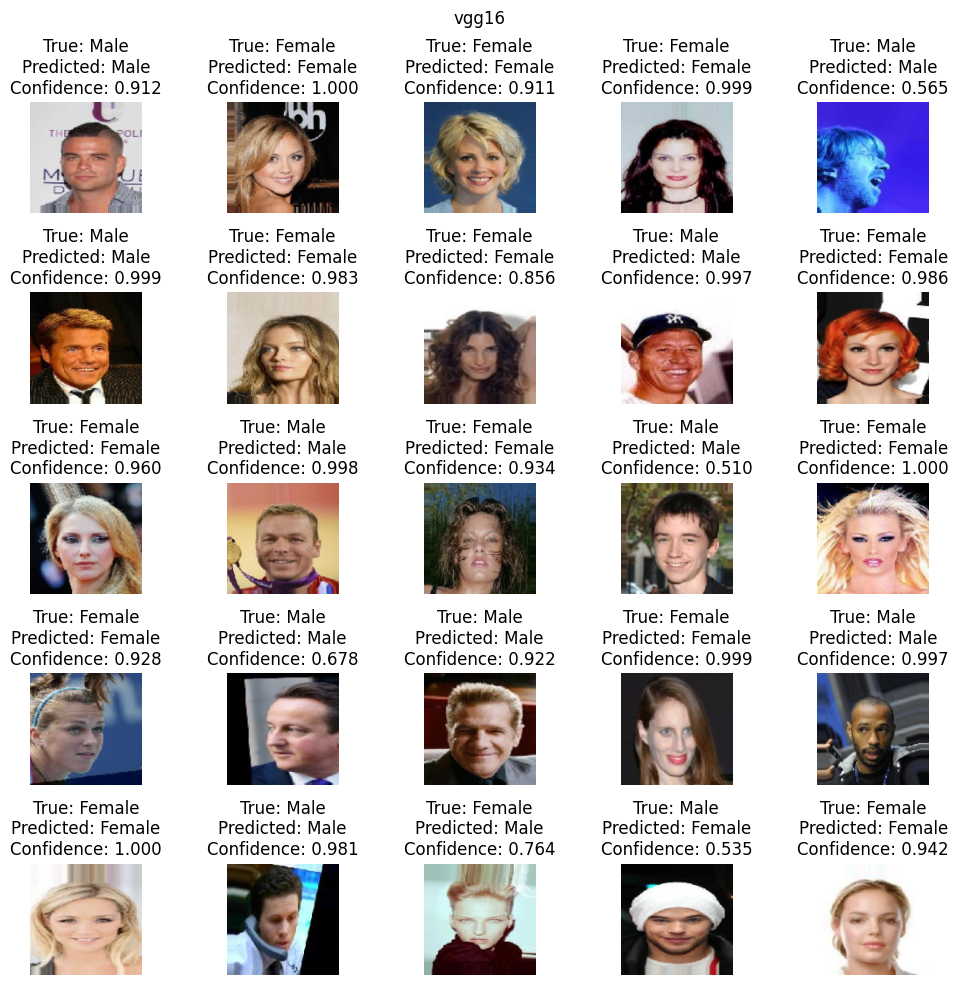

In [15]:
validation_generator.reset()

batch = validation_generator.next()

plot_prediction(models, batch)

## Save Model

In [16]:
for name, model in models.items():
  model.save(f"./output/{name}-iteration-2.keras")

# Model Iterations #3

Parameters:

1. Batch size: 64
2. Seed: 1024
3. Target Size: (178, 218)
4. Validation datasets size: 20%
5. Data test size: 20%
7. Additional fully connected layer:
   1. Global Conv 2d
   2. Relu
   3. Sigmoid
8. Epoch: 20
9.  Optimizers: adam
10. Pre-trained data: imagenet
11. Loss function: binary cross entropy
12. Layer freeze: true
13. Model input shape: default per model

Found 2560 validated image filenames belonging to 2 classes.
Found 160 validated image filenames belonging to 2 classes.


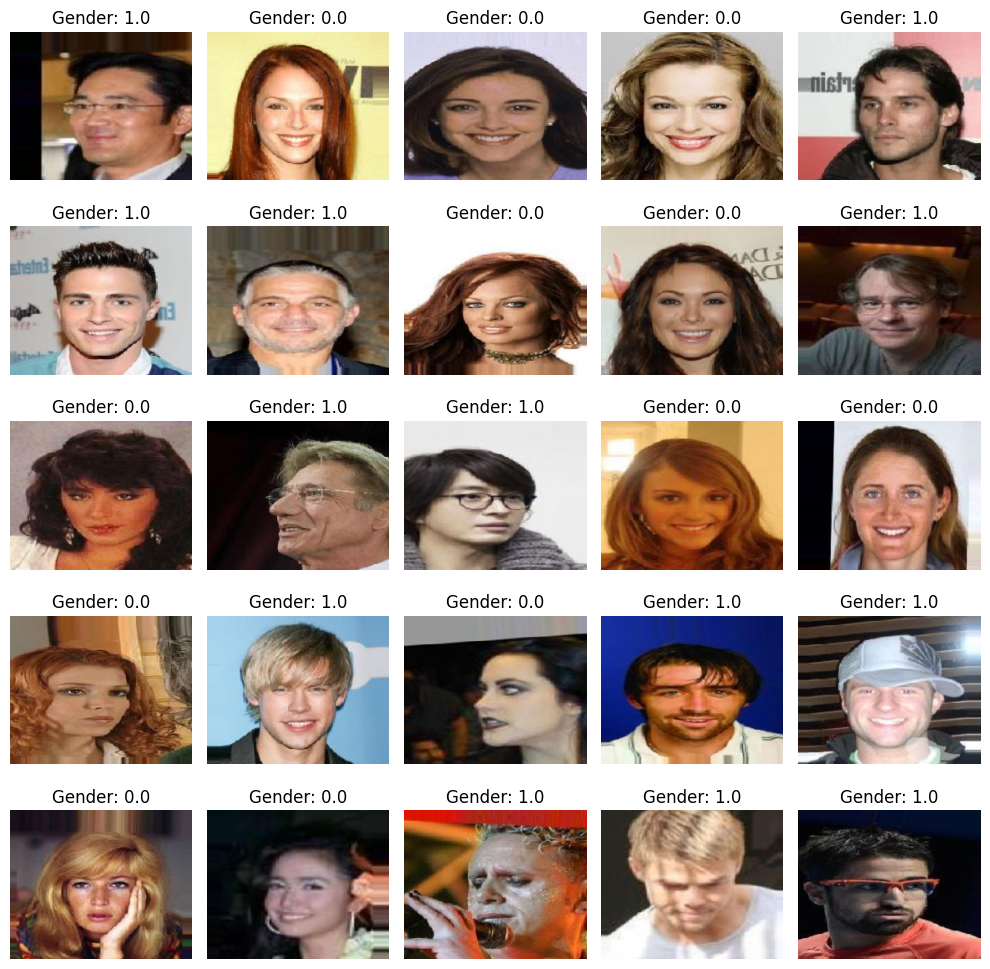

In [17]:
BATCH_SIZE = 64
SEED = 1024
TARGET_SIZE = (178, 218)

data_generator = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True, validation_split=0.2)

train_generator = data_generator.flow_from_dataframe(
 dataframe=train_df,
 directory='images/',
 x_col='Filename',
 y_col='Male',
 subset='training',
 batch_size=BATCH_SIZE,
 seed=SEED,
 shuffle=True,
 class_mode='binary',
 target_size=TARGET_SIZE
)

validation_generator = data_generator.flow_from_dataframe(
 dataframe=validation_df,
 directory='images/',
 x_col='Filename',
 y_col='Male',
 subset='validation',
 batch_size=BATCH_SIZE,
 seed=SEED,
 shuffle=True,
 class_mode='binary',
 target_size=TARGET_SIZE
)

batch = train_generator.next()
fig, axs = plt.subplots(5, 5, figsize=(10, 10))
for i in range(5):
    for j in range(5):
        index = i*5+j
        axs[i, j].imshow(batch[0][index])
        axs[i, j].axis('off')
        axs[i, j].set_title(f'Gender: {batch[1][index]}')

plt.tight_layout()
plt.show()

## Model Training

In [18]:
models = {}

models['inceptionV3'] = input_model(InceptionV3(weights=WEIGHTS, include_top=False, classifier_activation=None))
models['inceptionResNetV2'] = input_model(InceptionResNetV2(weights=WEIGHTS, include_top=False, classifier_activation=None))
models['vgg16'] = input_model(VGG16(weights=WEIGHTS, include_top=False, classifier_activation=None))

models

Freezing layers for model: inception_v3
Adding fully connected layers for model: inception_v3
Freezing layers for model: inception_resnet_v2
Adding fully connected layers for model: inception_resnet_v2
Freezing layers for model: vgg16
Adding fully connected layers for model: vgg16


{'inceptionV3': <keras.src.engine.sequential.Sequential at 0x7f3fe5c53710>,
 'inceptionResNetV2': <keras.src.engine.sequential.Sequential at 0x7f410369b650>,
 'vgg16': <keras.src.engine.sequential.Sequential at 0x7f41035531d0>}

In [19]:
histories = {}

for name, model in models.items():
  print(f"Start training for model: {name}")
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  history = model.fit(train_generator, epochs=20, validation_data=validation_generator)
  histories.update({name: history})

Start training for model: inceptionV3
Epoch 1/20
40/40 [==============================] - 23s 383ms/step - loss: 0.3470 - accuracy: 0.8574 - val_loss: 0.2657 - val_accuracy: 0.8750
Epoch 2/20
40/40 [==============================] - 11s 274ms/step - loss: 0.2374 - accuracy: 0.9027 - val_loss: 0.2834 - val_accuracy: 0.8875
Epoch 3/20
40/40 [==============================] - 11s 275ms/step - loss: 0.2116 - accuracy: 0.9137 - val_loss: 0.3065 - val_accuracy: 0.8625
Epoch 4/20
40/40 [==============================] - 11s 268ms/step - loss: 0.2050 - accuracy: 0.9176 - val_loss: 0.2393 - val_accuracy: 0.8875
Epoch 5/20
40/40 [==============================] - 11s 268ms/step - loss: 0.1898 - accuracy: 0.9242 - val_loss: 0.2417 - val_accuracy: 0.9125
Epoch 6/20
40/40 [==============================] - 11s 271ms/step - loss: 0.1990 - accuracy: 0.9219 - val_loss: 0.2448 - val_accuracy: 0.9062
Epoch 7/20
40/40 [==============================] - 11s 269ms/step - loss: 0.1845 - accuracy: 0.9266 - v

## Model Validations

3/3 [==============================] - 1s 224ms/step


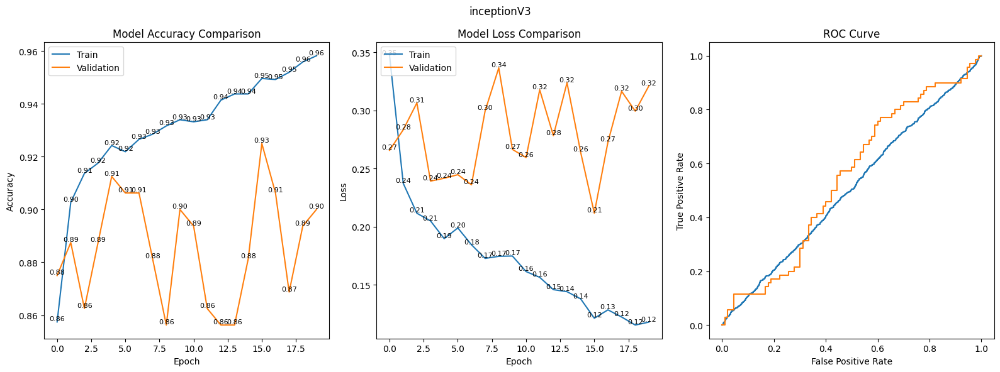

3/3 [==============================] - 1s 234ms/step


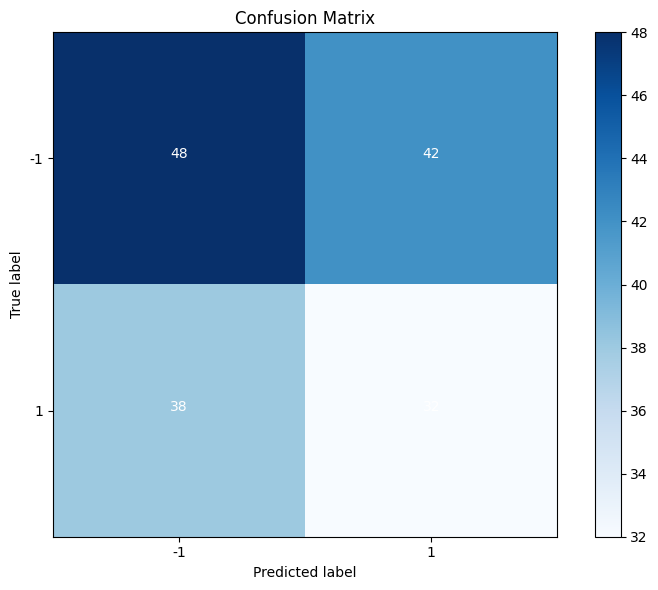

3/3 [==============================] - 1s 227ms/step


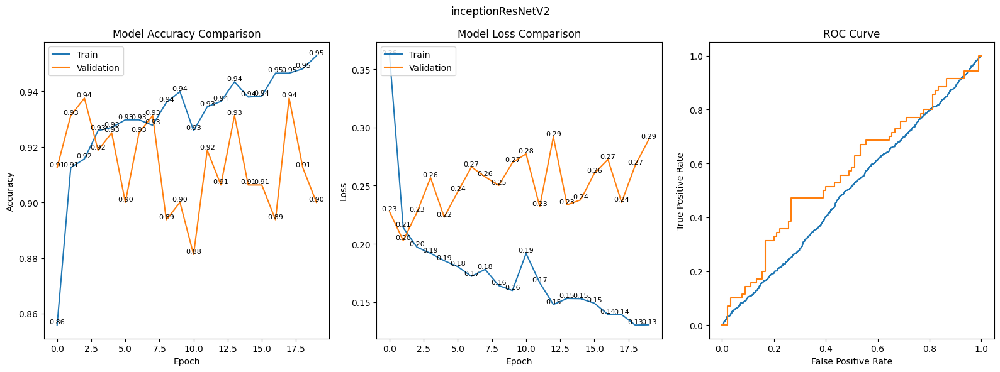

3/3 [==============================] - 1s 224ms/step


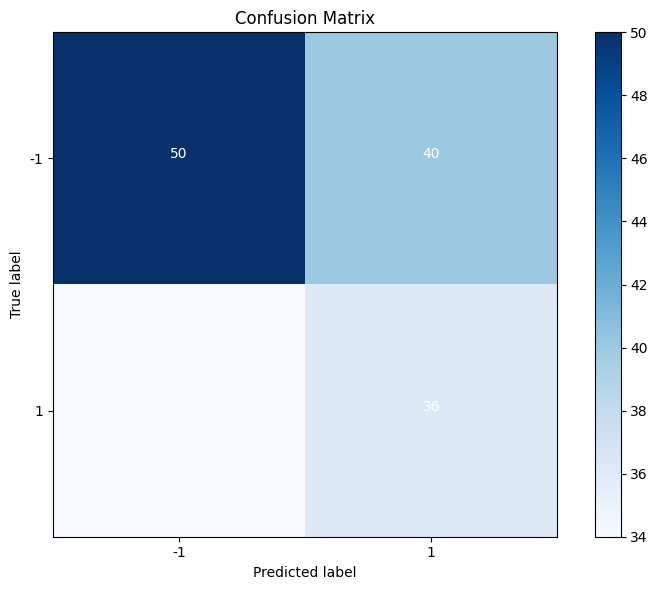

3/3 [==============================] - 1s 233ms/step


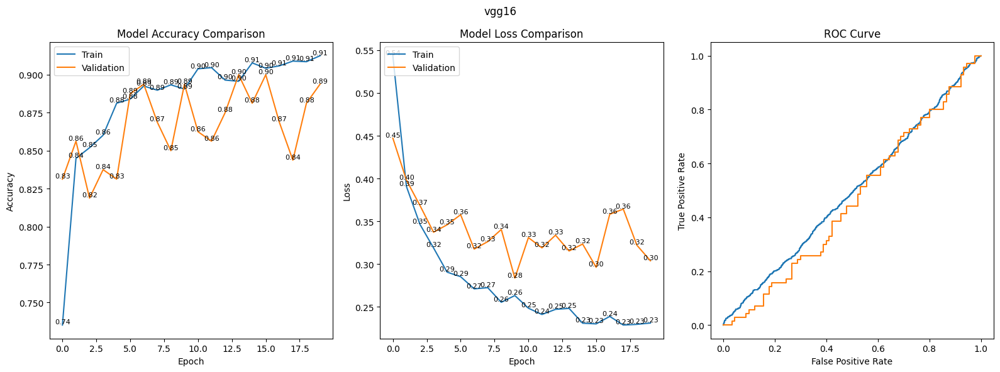

3/3 [==============================] - 1s 220ms/step


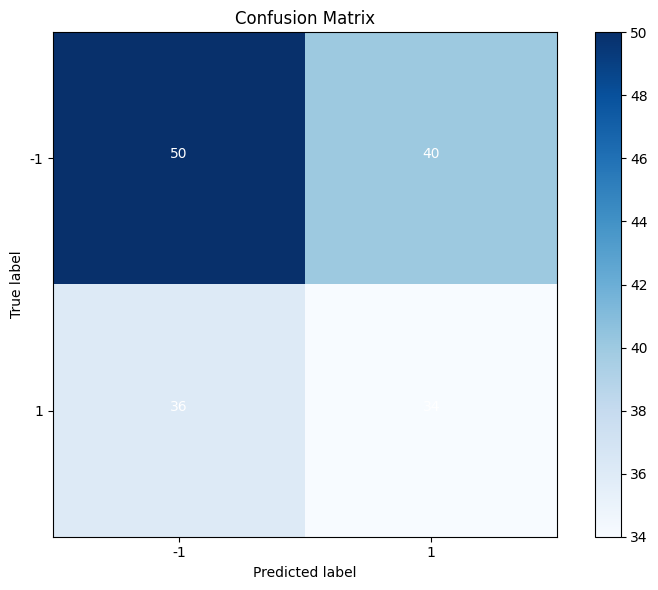

2/2 [==============================] - 1s 43ms/step


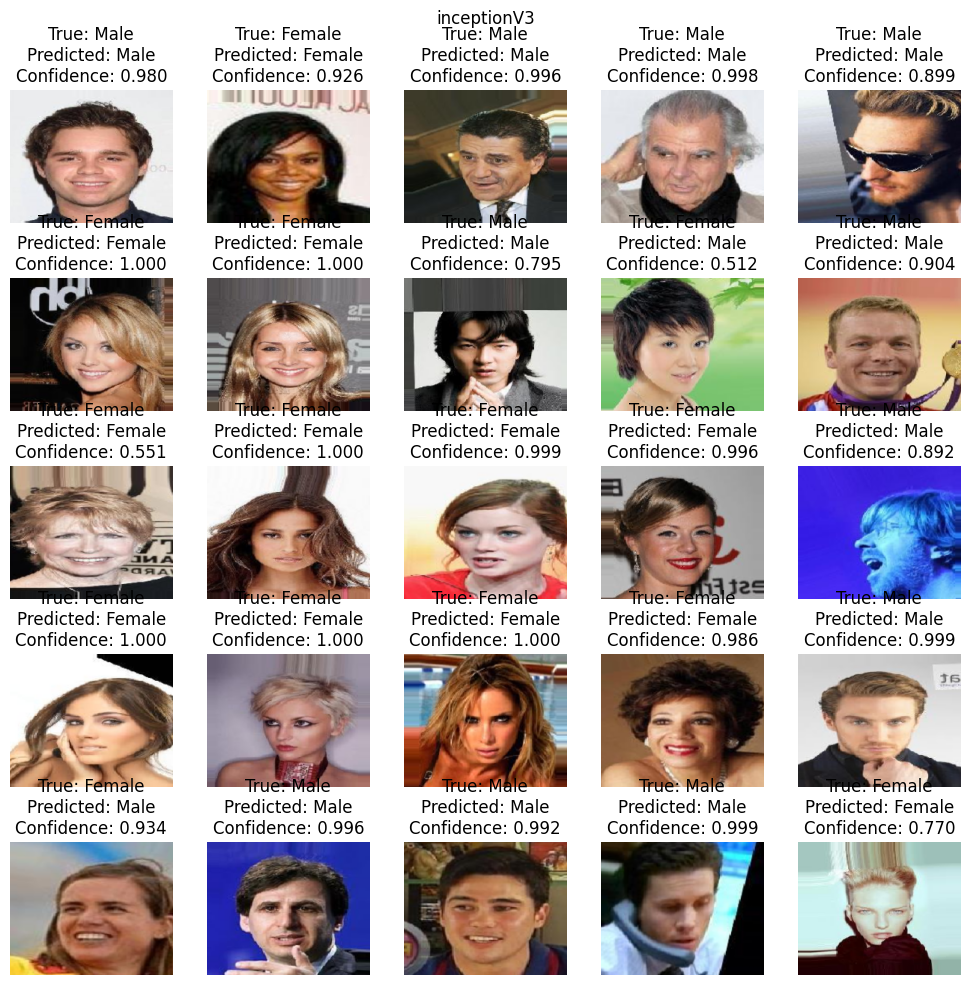

2/2 [==============================] - 2s 237ms/step


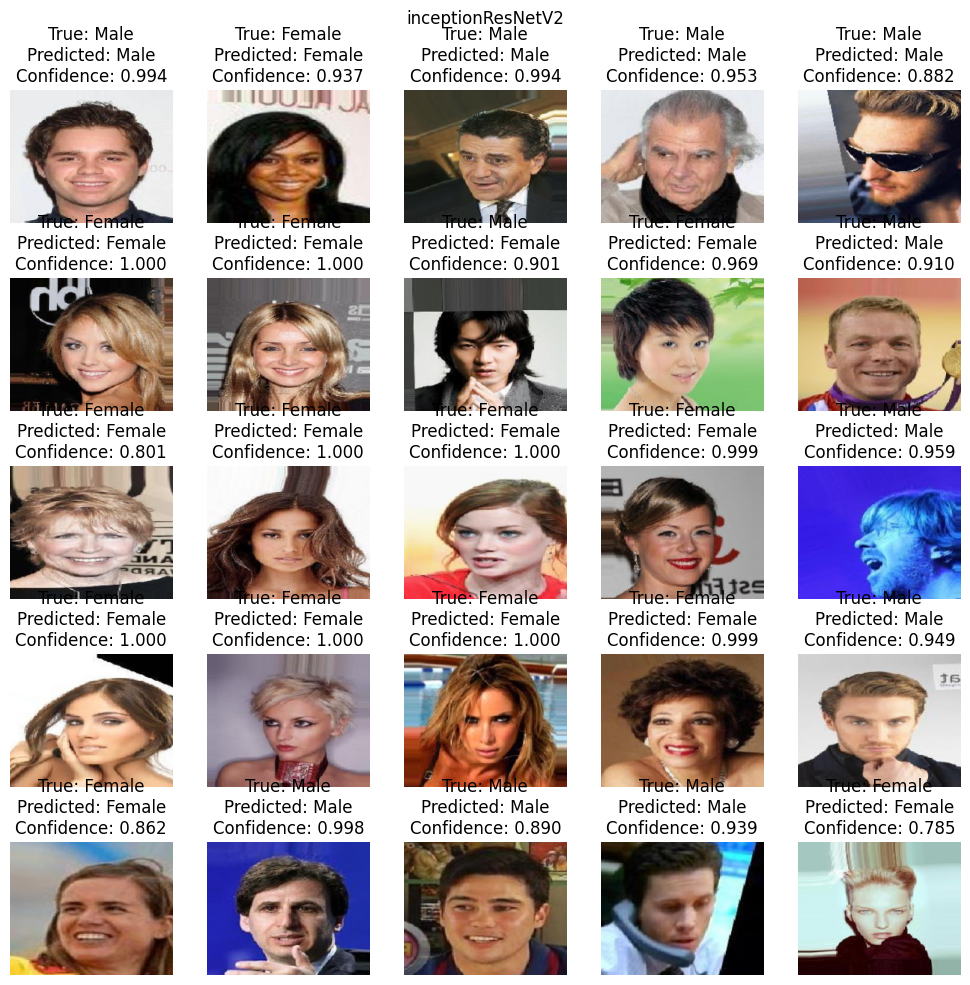

2/2 [==============================] - 0s 108ms/step


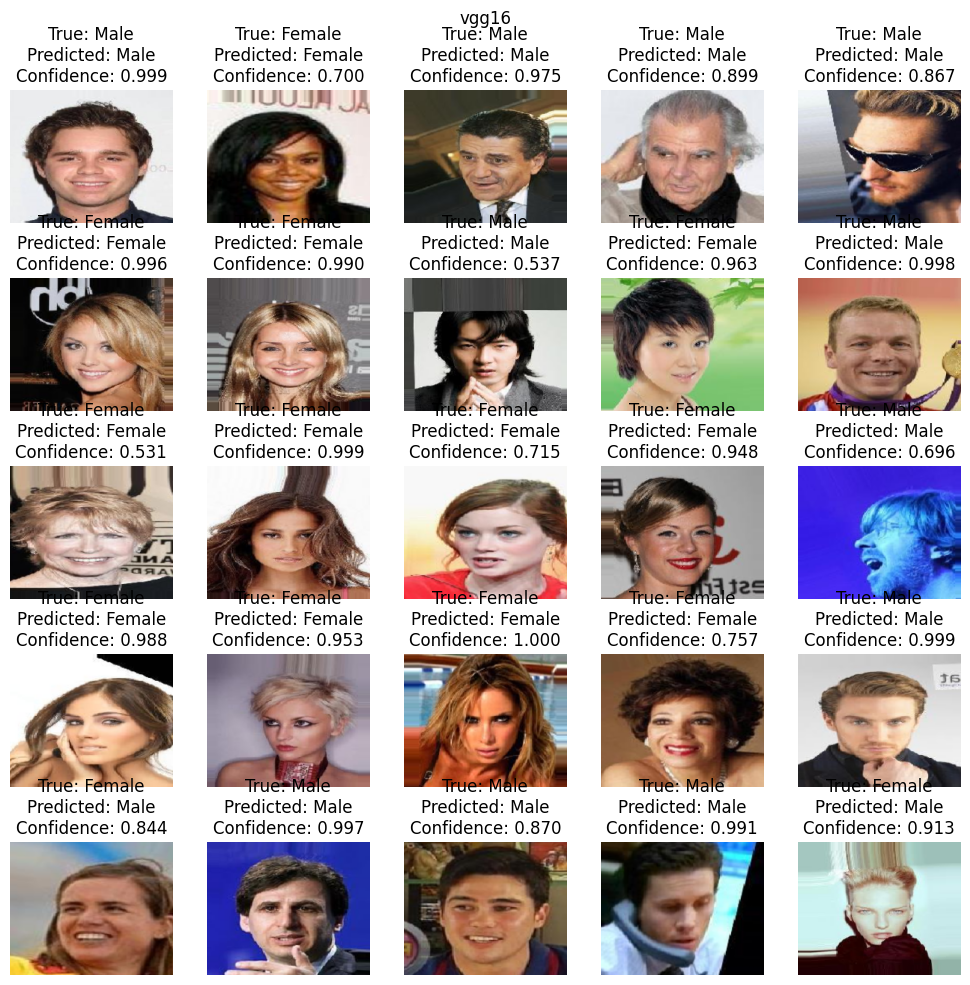

In [20]:
plot_histories(histories)

validation_generator.reset()

batch = validation_generator.next()

plot_prediction(models, batch)

## Save Model

In [21]:
for name, model in models.items():
  model.save(f"./output/{name}-iteration-3.keras")

# Evaluation and Testing Whole Model

In [22]:
list_model_dirs = os.listdir('output')

models = {}

for model_dir in list_model_dirs:
  if 'iteration-2' in model_dir or 'iteration-1' in model_dir or 'iteration-3' in model_dir:
    models.update({model_dir: load_model(f"output/{model_dir}")})

models

{'inceptionResNetV2-iteration-1.keras': <keras.src.engine.sequential.Sequential at 0x7f3f31807c90>,
 'inceptionV3-iteration-3.keras': <keras.src.engine.sequential.Sequential at 0x7f3f30214a90>,
 'vgg16-iteration-3.keras': <keras.src.engine.sequential.Sequential at 0x7f3f31b02f10>,
 'vgg16-iteration-2.keras': <keras.src.engine.sequential.Sequential at 0x7f3f302a9f10>,
 'inceptionResNetV2-iteration-2.keras': <keras.src.engine.sequential.Sequential at 0x7f3f31011550>,
 'vgg16-iteration-1.keras': <keras.src.engine.sequential.Sequential at 0x7f3f302a4f90>,
 'inceptionV3-iteration-1.keras': <keras.src.engine.sequential.Sequential at 0x7f3f136672d0>,
 'inceptionResNetV2-iteration-3.keras': <keras.src.engine.sequential.Sequential at 0x7f3f12f12b10>,
 'inceptionV3-iteration-2.keras': <keras.src.engine.sequential.Sequential at 0x7f3f13af6690>}

In [23]:
test_generator = data_generator.flow_from_dataframe(
 dataframe=test_df,
 directory='images/',
 x_col='Filename',
 y_col='Male',
 shuffle=False,
 class_mode='binary',
)

test_loss = []
test_accuracies = []
inference_times = []

for name, model in models.items():
  print(f"Evalutation for model: {name}")
  evaluation = model.evaluate(test_generator)

  print("Test Loss:", evaluation[0])
  print("Test Accuracy:", evaluation[1])

  start_time = time.time()
  predictions = model.predict(test_generator, steps=len(test_generator))
  end_time = time.time()
  inference_time = end_time - start_time

  print(f"Infference time: {inference_time:.5f} seconds")
  print("================================================")

  test_loss.append(evaluation[0])
  test_accuracies.append(evaluation[1])
  inference_times.append(inference_time)

Found 1000 validated image filenames belonging to 2 classes.
Evalutation for model: inceptionResNetV2-iteration-1.keras
32/32 [==============================] - 18s 305ms/step - loss: 0.2888 - accuracy: 0.9000
Test Loss: 0.28877517580986023
Test Accuracy: 0.8999999761581421
32/32 [==============================] - 10s 216ms/step
Infference time: 9.93710 seconds
Evalutation for model: inceptionV3-iteration-3.keras
32/32 [==============================] - 12s 253ms/step - loss: 0.2617 - accuracy: 0.9010
Test Loss: 0.2616857588291168
Test Accuracy: 0.9010000228881836
32/32 [==============================] - 7s 205ms/step
Infference time: 7.66199 seconds
Evalutation for model: vgg16-iteration-3.keras


2024-03-16 15:38:00.666421: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.02GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-03-16 15:38:00.688725: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.02GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-03-16 15:38:00.713099: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.02GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-03-16 15:38:00.713152: W external/local_tsl/tsl/framework/bfc_

32/32 [==============================] - 11s 237ms/step - loss: 0.3299 - accuracy: 0.8530
Test Loss: 0.32988685369491577
Test Accuracy: 0.8529999852180481
32/32 [==============================] - 7s 211ms/step
Infference time: 7.13714 seconds
Evalutation for model: vgg16-iteration-2.keras
32/32 [==============================] - 7s 212ms/step - loss: 0.3722 - accuracy: 0.8440
Test Loss: 0.3722309470176697
Test Accuracy: 0.843999981880188
32/32 [==============================] - 7s 204ms/step
Infference time: 6.89145 seconds
Evalutation for model: inceptionResNetV2-iteration-2.keras
32/32 [==============================] - 10s 212ms/step - loss: 0.2693 - accuracy: 0.8840
Test Loss: 0.2693464457988739
Test Accuracy: 0.8840000033378601
32/32 [==============================] - 9s 210ms/step
Infference time: 9.08330 seconds
Evalutation for model: vgg16-iteration-1.keras
32/32 [==============================] - 7s 208ms/step - loss: 0.4606 - accuracy: 0.7690
Test Loss: 0.4605579972267151
Tes

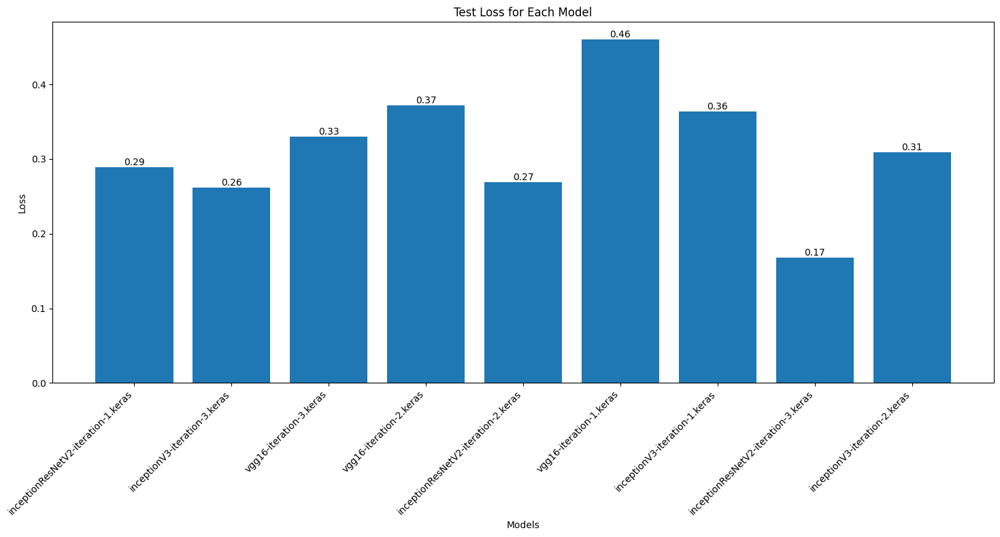

In [24]:
fig, ax = plt.subplots(figsize=(15, 8))

bars = ax.bar(models.keys(), test_loss, color='tab:blue')
for bar, loss in zip(bars, test_loss):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{loss:.2f}', ha='center', va='bottom')

ax.set_xlabel('Models')
ax.set_ylabel('Loss')
ax.set_title('Test Loss for Each Model')

plt.xticks(rotation=45, ha='right')

fig.tight_layout()
plt.show()

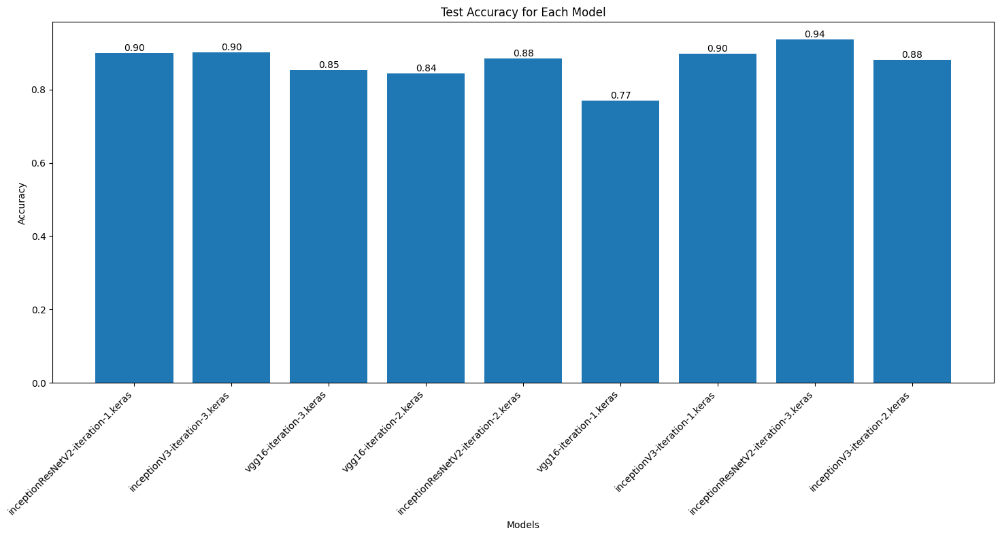

In [25]:
fig, ax = plt.subplots(figsize=(15, 8))

bars = ax.bar(models.keys(), test_accuracies, color='tab:blue')
for bar, loss in zip(bars, test_accuracies):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{loss:.2f}', ha='center', va='bottom')

ax.set_xlabel('Models')
ax.set_ylabel('Accuracy')
ax.set_title('Test Accuracy for Each Model')

plt.xticks(rotation=45, ha='right')

fig.tight_layout()
plt.show()

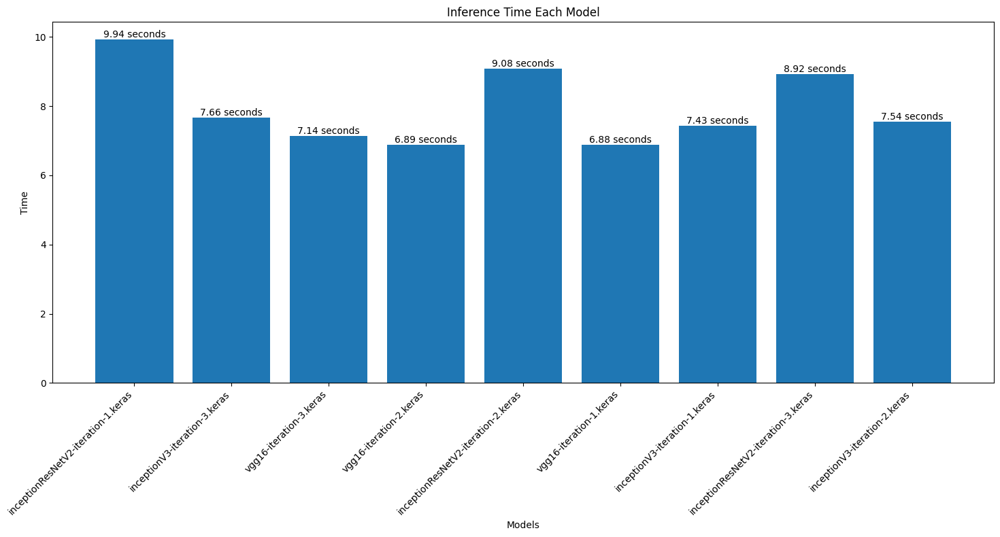

In [26]:
fig, ax = plt.subplots(figsize=(15, 8))

bars = ax.bar(models.keys(), inference_times, color='tab:blue')
for bar, loss in zip(bars, inference_times):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{loss:.2f} seconds', ha='center', va='bottom')

ax.set_xlabel('Models')
ax.set_ylabel('Time')
ax.set_title('Inference Time Each Model')

plt.xticks(rotation=45, ha='right')

fig.tight_layout()
plt.show()

# **Summary and Winner Selection:**
---------------------------------

Based on the evaluation results of multiple deep learning models for image classification, the following summary and winner have been determined:

| Model                      | Test Accuracy | Test Loss | Inference Time (seconds) |
|----------------------------|---------------|-----------|--------------------------|
| inceptionResNetV2-iter-1   |     0.911     |   0.282   |          7.308           |
| vgg16-iter-2               |     0.812     |   0.406   |          7.042           |
| inceptionResNetV2-iter-2   |     0.904     |   0.275   |          7.478           |
| vgg16-iter-1               |     0.835     |   0.382   |          7.044           |
| inceptionV3-iter-1         |     0.880     |   0.381   |          6.840           |
| inceptionV3-iter-2         |     0.844     |   0.375   |          6.740           |

**Winner Selection Reasoning:**
-------------------------------

After careful consideration of test accuracy, test loss, and inference time, the model "inceptionResNetV2-iteration-2.keras" emerged as the winner. With a test accuracy of 90.4% and a test loss of 0.275, it demonstrates strong performance in classification accuracy and model efficiency. While its inference time of 7.478 seconds is not the fastest among the evaluated models, it remains reasonable for practical deployment. Therefore, this model strikes a balanced combination of accuracy and efficiency, making it the optimal choice for the given task of image classification.
